# Libs

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import skimage.io
from PIL import Image
import os

DIR_FILES = os.getcwd() + "/files/"

# Q1

Usando a definição de conectividade de pixels, faça um programa que conte
automaticamente o número de palitos de fósforo na imagem Fig8.02, informando
também a área (número de pixels) de cada um deles. Seu programa deve fornecer a
área de cada palito (desconsidere a cabeça dos palitos). Observe que você terá que
binarizar a imagem: gere o seu histograma e escolha um valor de limiar para
mapear, acima dele, no nível de cinza 255; e abaixo ou igual a ele, no nível de cinza
0.


### Carregando imagem original

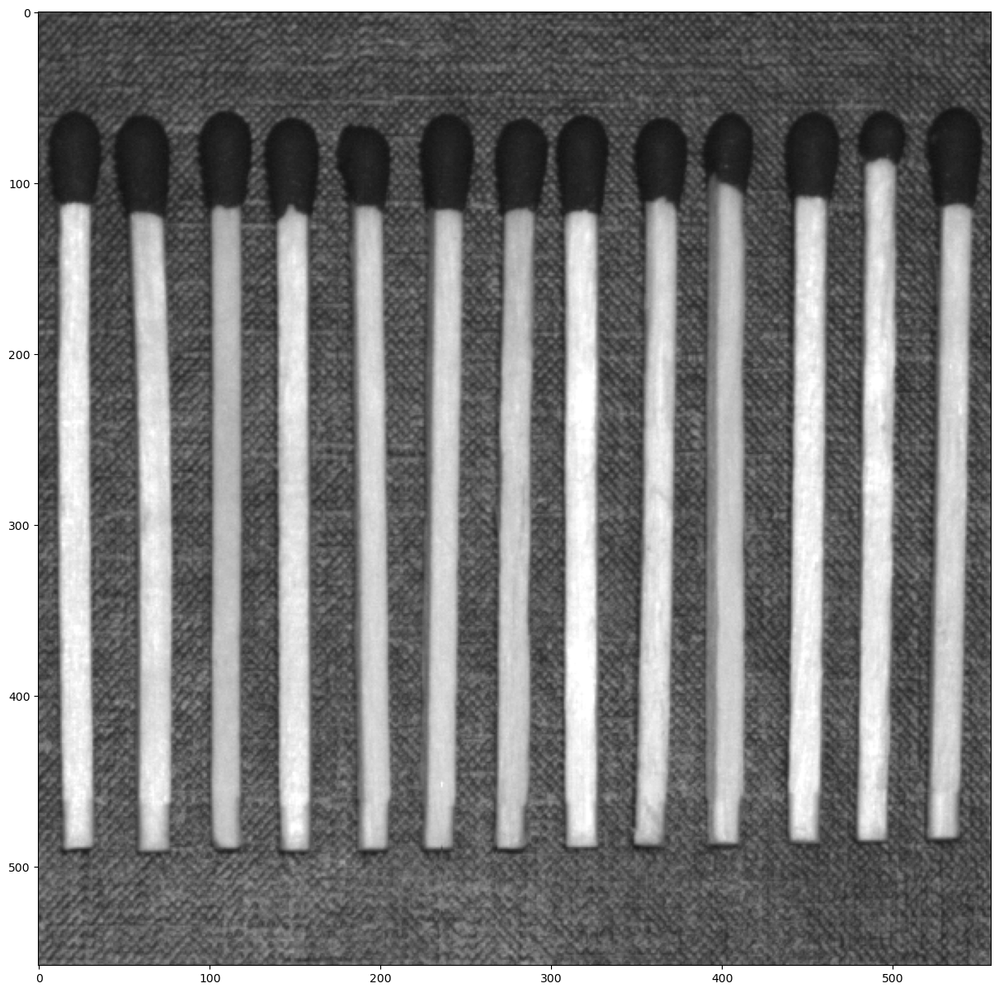

(558, 558)

In [2]:
im = np.array(plt.imread(DIR_FILES + 'Fig8.02.jpg'))
plt.figure(figsize = (15,15))
plt.imshow(im,cmap='gray',vmin=0,vmax=255)
plt.show() 
im.shape

### Gerando histograma

<BarContainer object of 256 artists>

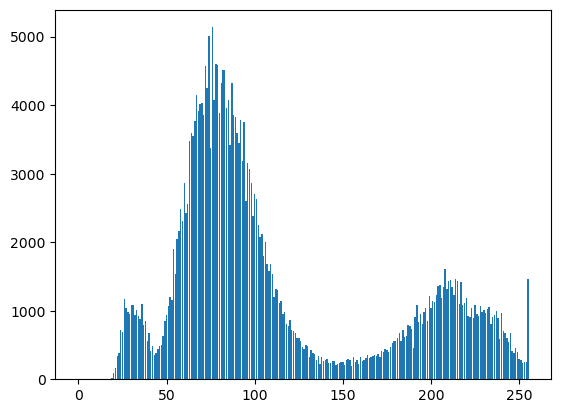

In [3]:
def histo(image):
    vet = np.zeros(256, dtype=np.uint64)
    for pixel in image.ravel():
        vet[pixel] = vet[pixel]+1
    return vet

plt.bar(range(0,256),histo(im))

### Binarizando Imagem

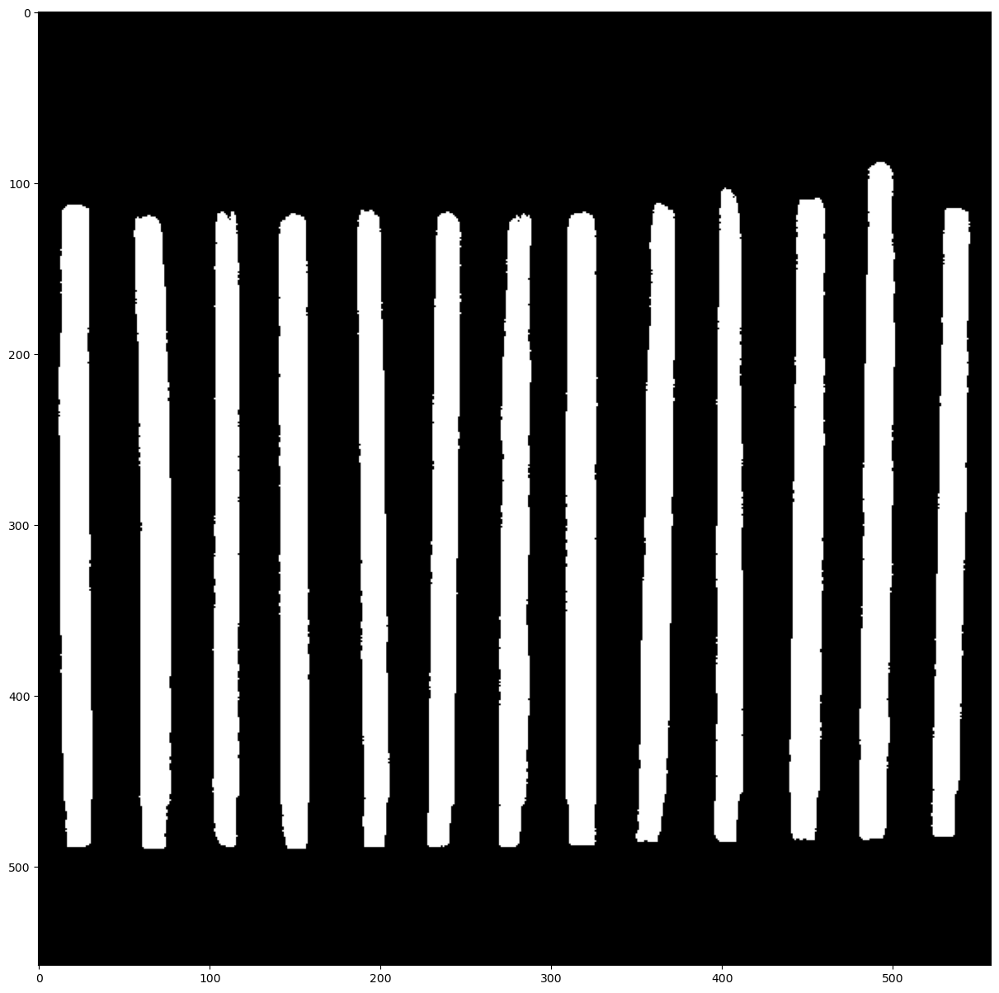

In [4]:
def binary_image(image,threshold):
    image_bin = np.empty_like(image)
    for l in range(0,len(image)):
        for c in range(0,len(image)):
            if threshold >= image[l][c]:
                image_bin[l][c] = 0
            else:
                image_bin[l][c] = 255
    return image_bin

threshold = 160
bin_image = binary_image(im,threshold)
plt.figure(figsize = (15,15))
plt.imshow(bin_image,cmap='gray',vmin=0,vmax=255)
plt.show() 

### Contando quantidade de palitos

In [5]:
def conta_palitos(image):
    centered_line = image[int(len(image)/2),:]
    counter = 0
    for i in range(0,len(image)):
        if centered_line[i] == 255:
            if centered_line[i-1] == 0:
                counter = counter + 1
    return counter     

numero_palitos = conta_palitos(bin_image)
print("Palitos na imagem: ", numero_palitos)

Palitos na imagem:  13


### Calculando área dos palitos

In [6]:
def area_palitos(image):
    number_sticks = conta_palitos(image)
    x_grid = int(len(image)/number_sticks)
    areas = np.zeros(number_sticks)
    for i in range(0,number_sticks):
        offset = i*x_grid
        count_pixel = 0
        for c in range(i*x_grid,i*x_grid+x_grid):
            for l in range(0,len(image)):
                if image[l][c] == 255:
                    count_pixel = count_pixel + 1
        areas[i] = count_pixel
    return list(areas)

areas = area_palitos(bin_image)

for i in range(len(areas)):
    print("Área do Palito " + str(i+1) + ": " + str(round(areas[i])) + " pixels")


Área do Palito 1: 6336 pixels
Área do Palito 2: 6382 pixels
Área do Palito 3: 5171 pixels
Área do Palito 4: 6057 pixels
Área do Palito 5: 5342 pixels
Área do Palito 6: 5465 pixels
Área do Palito 7: 5736 pixels
Área do Palito 8: 6418 pixels
Área do Palito 9: 5778 pixels
Área do Palito 10: 5419 pixels
Área do Palito 11: 6351 pixels
Área do Palito 12: 6421 pixels
Área do Palito 13: 5647 pixels


Inicialmente foi gerado o histograma da imagem para escolher uma intensidade apropriada para a binarização da imagem. Após a binarização a contagem dos palitos é feita adicionando um linha horizontal bem no meio da imagem funcionando para verificar as transições de um pixel 0 para um pixel 255 totalizando assim o número de palitos pelo número de transições. No cálculo da área a imagem é divida pelo número de palitos, assim em cada parte é verificada a quantidade de pixels = 255.

# Q2

 Aplique equalização de histograma às imagens train.jpg e scene.png. Compare as
imagens e seus histogramas antes e depois da equalização. Observe que a imagem
scene.png após a equalização ficou com uma parte muito clara. Que transformação
poderia ser aplicada para corrigir isto? Aplique-a e comente o resultado. 

### Carregando Imagens

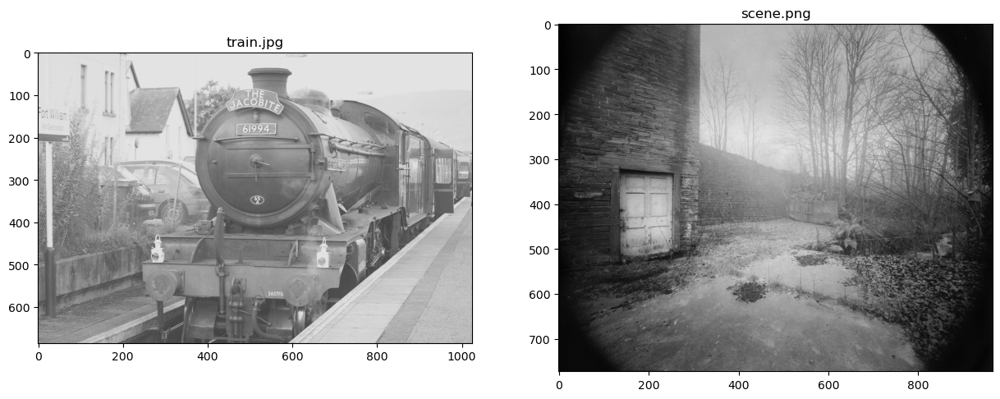

In [7]:
im1 = np.array(plt.imread(DIR_FILES + 'train.jpg'))
im2 = np.array(plt.imread(DIR_FILES + 'scene.png'))
im2 *= 255
im2 = im2.astype(np.uint8)

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 15))
axs[0].imshow(im1,cmap='gray',vmin=0,vmax=255)
axs[1].imshow(im2,cmap='gray',vmin=0,vmax=255)
axs[0].set_title('train.jpg')
axs[1].set_title('scene.png')
plt.show()

### Histograma sem equalização

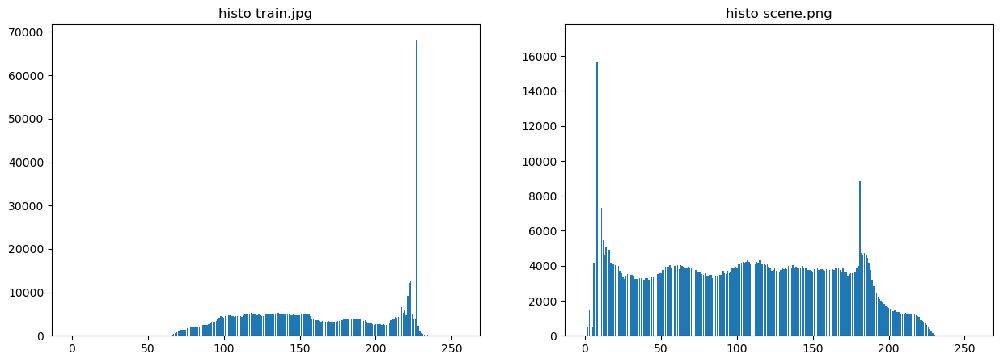

In [8]:
def histo(image):
    vet = np.zeros(256, dtype=np.uint64)
    for pixel in image.ravel():
        vet[pixel] = vet[pixel]+1
    return vet

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
axs[0].bar(range(0,256),histo(im1))
axs[1].bar(range(0,256),histo(im2))
axs[0].set_title('histo train.jpg')
axs[1].set_title('histo scene.png')
plt.show() 

### Aplicando equalização de histograma

In [9]:
def equalize_histo(image):

    hist = histo(image)
    image_eq = np.zeros(image.shape)
    cdf = np.cumsum(hist)
    s = ((cdf - 0) / (image.shape[0]*image.shape[1] - 0)) * 255
    s = np.round(s)
    image_histo_equal = s[image].astype(np.uint64)
    return image_histo_equal

In [10]:
im1_equalizada = equalize_histo(im1)
im2_equalizada = equalize_histo(im2)

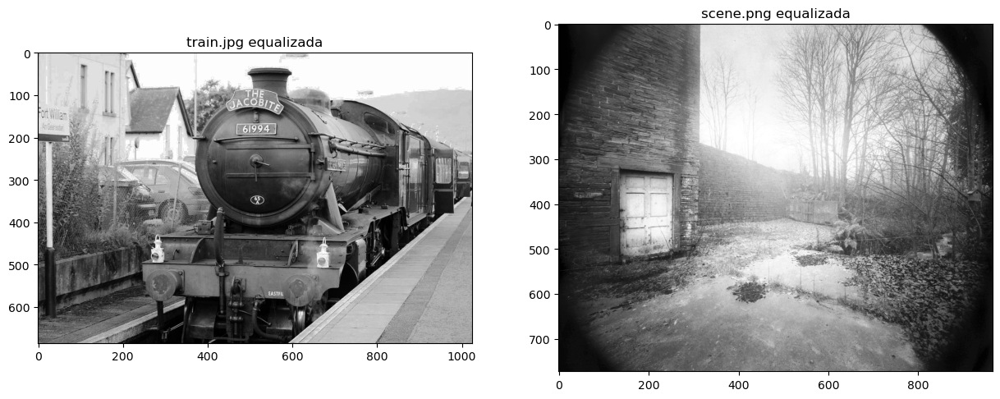

In [11]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 15))
axs[0].imshow(im1_equalizada,cmap='gray',vmin=0,vmax=255)
axs[1].imshow(im2_equalizada,cmap='gray',vmin=0,vmax=255)
axs[0].set_title('train.jpg equalizada')
axs[1].set_title('scene.png equalizada')
plt.show()

### Histograma com equalização

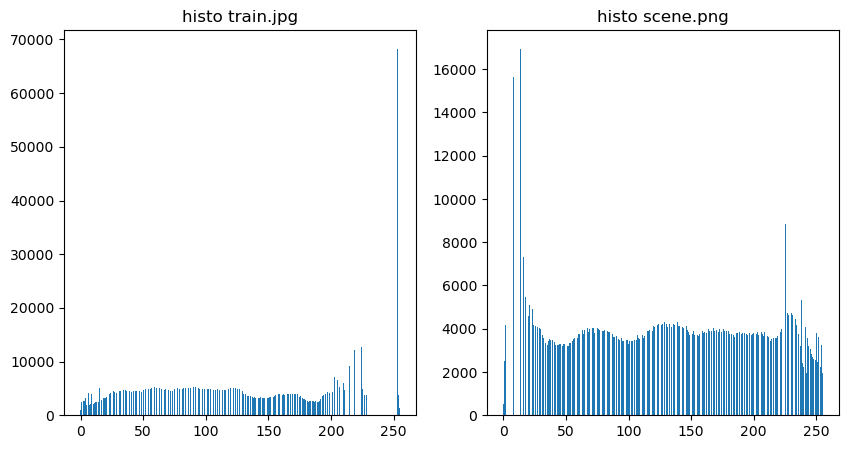

In [12]:
def histo(image):
    vet = np.zeros(256, dtype=np.uint64)
    for pixel in image.ravel():
        vet[pixel] = vet[pixel]+1
    return vet

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))
axs[0].bar(range(0,256),histo(im1_equalizada))
axs[1].bar(range(0,256),histo(im2_equalizada))
axs[0].set_title('histo train.jpg')
axs[1].set_title('histo scene.png')
plt.show() 

### Realizando transformação Gamma

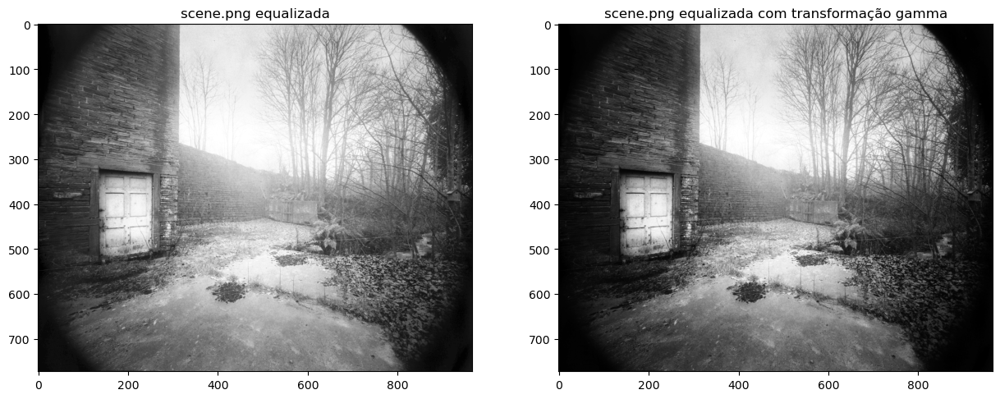

In [13]:
def gamma_transform(image, c, y):
    image_normalized = image/255
    image_transform = c*(image_normalized**y)
    image_transform = np.uint8(image_transform*255)
    return image_transform

c = 1
y = 1.5
im_gamma_transform = gamma_transform(im2_equalizada, c, y)

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 15))
axs[0].imshow(im2_equalizada,cmap='gray',vmin=0,vmax=255)
axs[1].imshow(im_gamma_transform,cmap='gray',vmin=0,vmax=255)
axs[0].set_title('scene.png equalizada')
axs[1].set_title('scene.png equalizada com transformação gamma');

Gerando o histograma é possível perceber como a imagem está distribuída em uma determinada faixa de valores de pixels. Após a equalização é possível perceber que a imagem que antes era meio cinza agora tem um aspecto melhor até para diferenciação de objetos e texturas na imagem. Na imagem scene.png após a equalização de histograma seu centro apresentou um área muito branca e para isso foi realizada uma transformação gamma a fim de diminuir esse aspecto esbranquiçado da imagem.

# Q3

Faça uma rotina que implemente uma máscara de convolução espacial de
dimensão NxN (N ímpar). Discute possíveis soluções para tratamento de bordas e
implemente uma delas. Teste a rotina implementada na imagem lena.tif, para os
seguintes casos: a) filtro passa-baixas, b) filtro laplaciano (adicionando a imagem
original ao resultado), c) filtro de Sobel (passe as duas máscaras e retorne a imagem
da magnitude do gradiente). Exiba os resultados obtidos e analise-os.

### Carregando imagem

In [14]:
im = np.array(plt.imread(DIR_FILES + '/lena.tif'))
im = np.pad(im,1,'reflect')

### Convolução NxN

In [15]:
def conv(image,mask):
    mask = np.flip(mask)
    cropped_image = np.zeros(((image.shape[0]-2*mask.shape[0]//2),(image.shape[1]-2*mask.shape[1]//2)))
    for l in range(cropped_image.shape[0]):
        for c in range(cropped_image.shape[1]):
            result = np.multiply(image[l:l+mask.shape[0],c:c+mask.shape[1]], mask)
            cropped_image[l,c] = np.sum(result)
    return cropped_image

### Aplicando Filtros

#### Filtro passa-baixas

In [16]:
def low_pass_filter(image,N):
    mask = np.ones((N, N)) / (N * N)
    filtered_image = conv(image,mask)
    return filtered_image

#### Filtro Laplaciano

In [17]:
def laplace_filter(image):
    mask = [[0, 1, 0],[1, -4, 1],[0, 1, 0]]
    filtered_image = conv(image,mask)
    return filtered_image

#### Filtro de Sobel

In [18]:
def sobel_filter(image):
    gx = [[-1,-2,-1],[0,0,0],[1,2,1]]
    gy = [[-1,0,1],[-2,0,2],[-1,0,1]]
    convx = conv(image,gx)
    convy = conv(image,gy)
    filtered_image = np.sqrt(convx**2+convy**2)
    return filtered_image

### Plot dos resultados

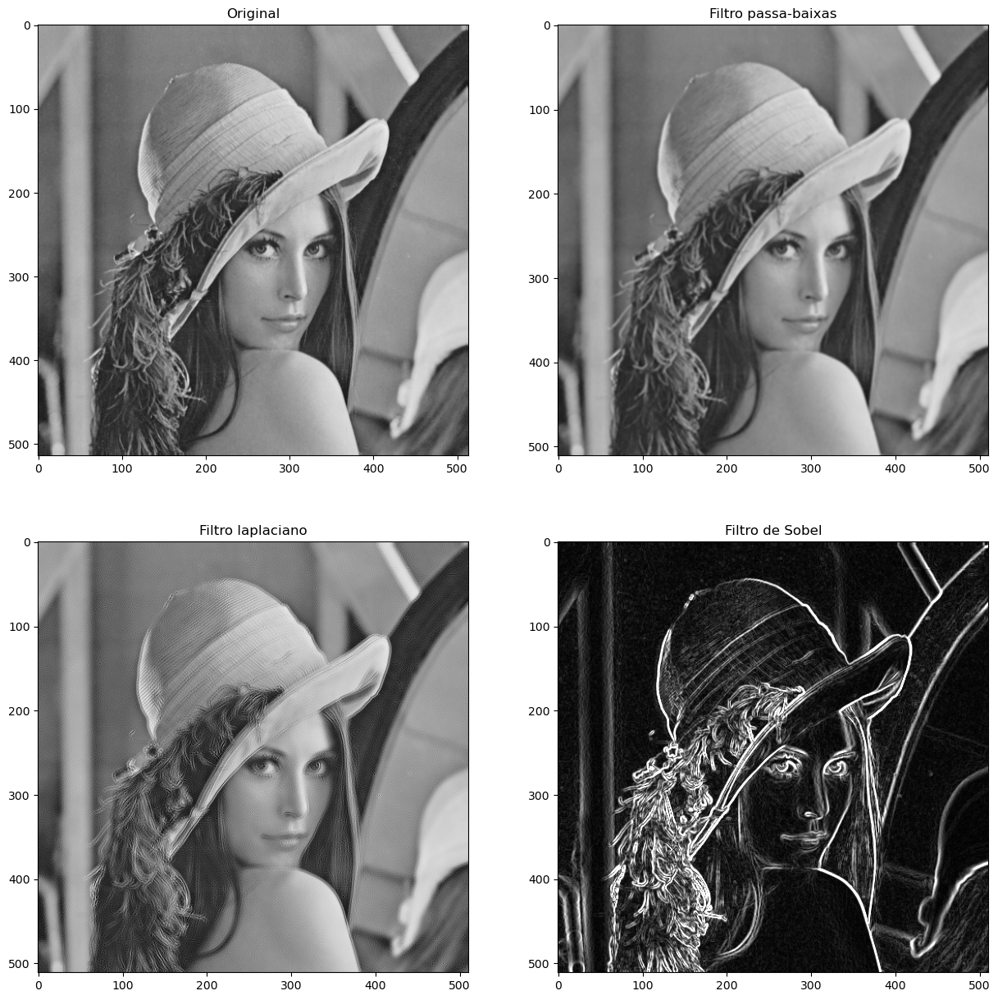

In [19]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(15, 15))
axs[0][0].imshow(im,cmap='gray',vmin=0,vmax=255)
axs[0][1].imshow(low_pass_filter(im,3),cmap='gray',vmin=0,vmax=255)
axs[1][0].imshow(laplace_filter(im) + im[1:-2, 1:-2],cmap='gray',vmin=0,vmax=255)
axs[1][1].imshow(sobel_filter(im),cmap='gray',vmin=0,vmax=255)
axs[0][0].set_title('Original')
axs[0][1].set_title('Filtro passa-baixas');
axs[1][0].set_title('Filtro laplaciano')
axs[1][1].set_title('Filtro de Sobel');
plt.show() 

Para a imagem não ser cortada em relação a imagem original, é aplicado o padding, que é uma borda espelhada da imagem de tamanho equivalente à metade da dimensão da máscara arredondada para baixo. Assim é possível passar a máscara em toda a imagem sem cortá-la.

O filtro passa baixas suaviza a imagem removendo possíveis ruídos e também detalhes finos. Dependendo do caso pode até borrar a imagem.
O filtro laplaciano realça as bordas e detalhes finos, ficando a imagem com maior nitidez.
O filtro de sobel detecta bordas na imagem calculando a magnitude do gradiente permitindo a detecção de bordas em diferentes sentidos da imagem.

# Q4

Uma máscara de convolução pode ser decomposta em duas máscaras mais
simples. Compare o resultado de uma máscara de convolução 11x11 de média
aritmética simples com o resultado obtido após aplicar uma sequência de máscaras
de média aritmética simples de dimensões 11x1 e 1x11. Use a imagem
Fig3.35(a).jpg para realizar os testes.

### Carregando Imagem

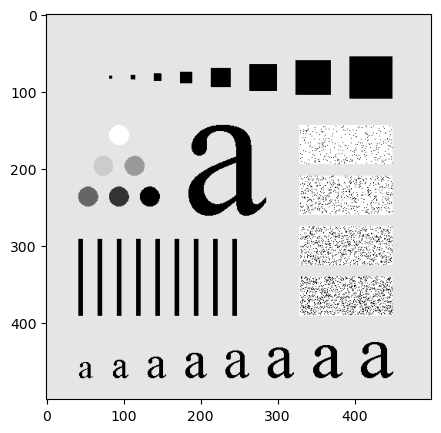

In [20]:
im = np.array(plt.imread(DIR_FILES + 'Fig3.35(a).jpg'))
plt.figure(figsize = (5,5))
plt.imshow(im,cmap='gray',vmin=0,vmax=255)
plt.show() 

### Função de Convolução

In [21]:
def conv(image,mask):
    mask = np.flip(mask) # 180º rotate
    cropped_image = np.zeros(((image.shape[0]-2*mask.shape[0]//2),(image.shape[1]-2*mask.shape[1]//2)))
    for l in range(cropped_image.shape[0]):
        for c in range(cropped_image.shape[1]):
            result = np.multiply(image[l:l+mask.shape[0],c:c+mask.shape[1]], mask)
            cropped_image[l,c] = np.sum(result)
    return cropped_image

### Máscara 11x11 de média aritmética

In [22]:
mask_11x11 = np.ones((11, 11)) / 121
im_conv_11x11 = conv(im, mask_11x11)

### Convolução Sequencial 11x1 e 1x11

In [23]:
mask_11x1 = np.ones((11, 1)) / 11
mask_1x11 = np.ones((1, 11)) / 11

im_11x1 = conv(im, mask_11x1)
im_conv_seq = conv(im_11x1, mask_1x11)

### Resultado

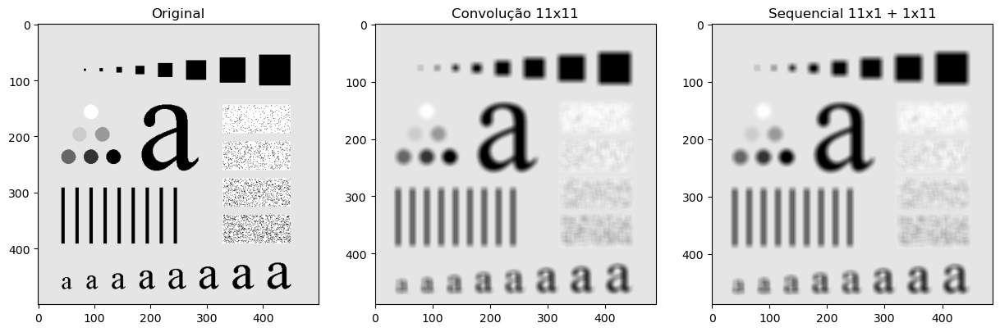

In [24]:
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(15, 15))
axs[0].imshow(im, cmap='gray',vmin=0,vmax=255)
axs[0].set_title('Original')

axs[1].imshow(im_conv_11x11, cmap='gray',vmin=0,vmax=255)
axs[1].set_title('Convolução 11x11')

axs[2].imshow(im_conv_seq,cmap='gray',vmin=0,vmax=255)
axs[2].set_title('Sequencial 11x1 + 1x11');

A máscara de média aritmética 11x11 suaviza a imagem aplicando a média dos pixels em uma janela 11x11. Quando decompomos essa máscara em duas máscaras mais simples (11x1 e 1x11), se aplica a média primeiro ao longo das colunas e depois ao longo das linhas, ou vice-versa.

O resultado da aplicação sequencial das máscaras deve ser equivalente a aplicação de uma única máscara 11x11. Mas com a precisão numérica e a forma como o padding é tratado, podem ocorrer pequenas diferenças. A aplicação sequencial pode ser mais eficiente computacionalmente, porque reduz a complexidade da convolução em grandes máscaras.

# Q5

Faça o fatiamento por planos de bit da imagem Fig5.26(a).jpg exibindo todos os
8 planos de bit da imagem. Depois reconstrua a imagem usando somente os 4 bits
mais significativos (considere que os valores dos bits menos significativos sejam
iguais a zero). Compare a imagem obtida com a original e comente.

### Carregando imagem

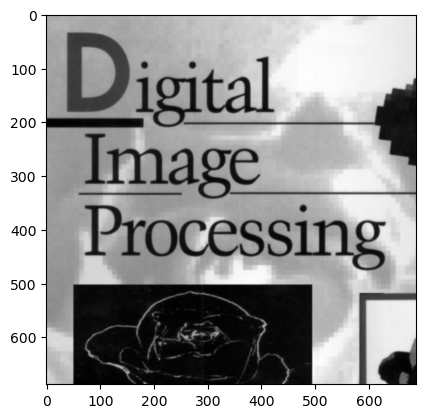

In [25]:
im = np.array(plt.imread(DIR_FILES + 'Fig5.26(a).jpg'))
plt.imshow(im,cmap='gray',vmin=0,vmax=255)

### Realizando fatiamento por planos de bit

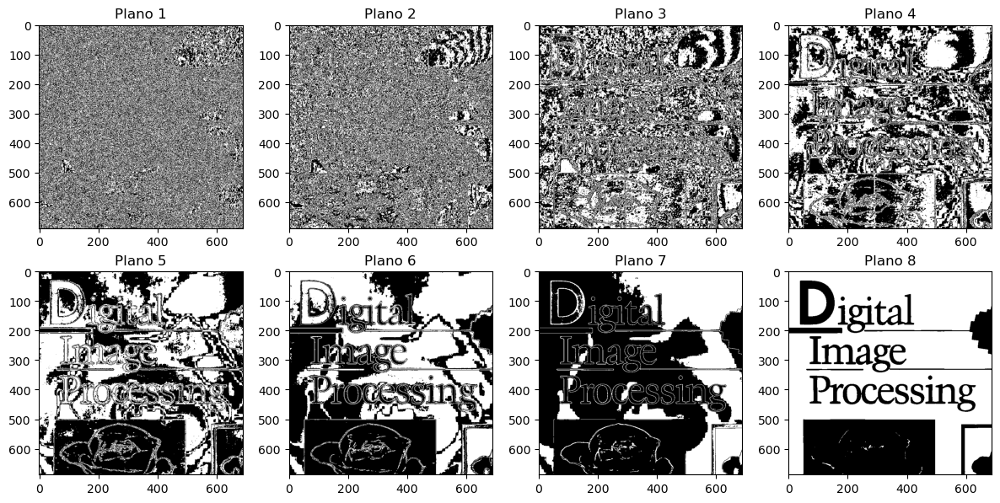

In [26]:
def bit_plane_slicing(image):
    bit_planes = []
    for i in range(8):
        bit_plane = np.zeros_like(image)
        for x in range(image.shape[0]):
            for y in range(image.shape[1]):
                bit_plane[x, y] = (image[x, y] >> i) & 1
        bit_planes.append(bit_plane * 255)
    return bit_planes

plt.figure(figsize=(12, 6))
for i, bit_plane in enumerate(bit_plane_slicing(im), start=1):
    plt.subplot(2, 4, i)
    plt.imshow(bit_plane,cmap="gray",vmin=0,vmax=255)
    plt.title(f'Plano {i}')
plt.tight_layout()
plt.show()

### Reconstruir imagem com 4 bits mais significativos

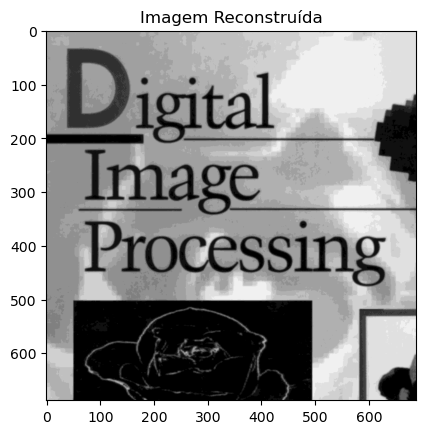

In [27]:
reconstructed_image = np.zeros_like(im)
for x in range(im.shape[0]):
    for y in range(im.shape[1]):
        pixel_value = 0
        for i in range(4):
            pixel_value |= ((im[x, y] >> (7 - i)) & 1) << (7 - i)
        reconstructed_image[x, y] = pixel_value
plt.imshow(reconstructed_image, cmap='gray', vmin=0, vmax=255)
plt.title('Imagem Reconstruída');

### Comparando imagens

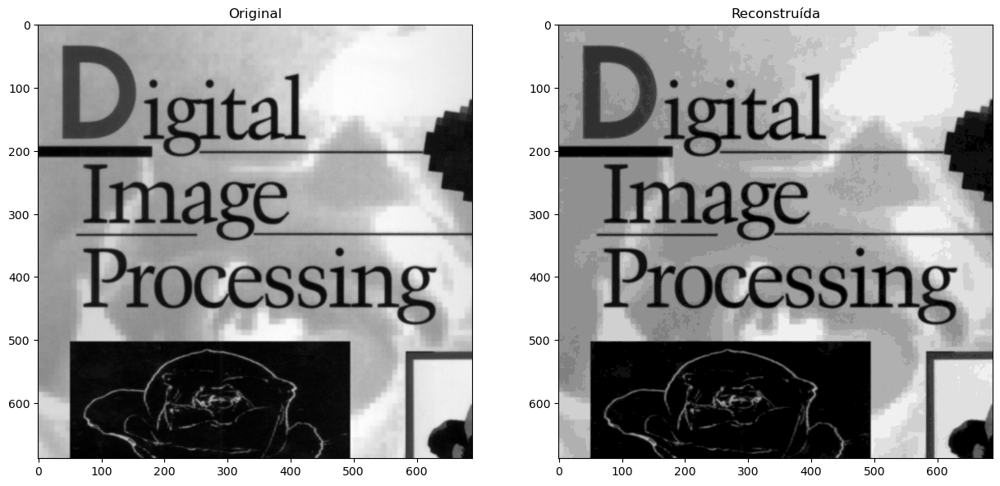

In [28]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 15))
axs[0].imshow(im,cmap='gray',vmin=0,vmax=255)
axs[1].imshow(reconstructed_image,cmap='gray',vmin=0,vmax=255)
axs[0].set_title('Original')
axs[1].set_title('Reconstruída')
plt.show()

É possível perceber que alguns detalhes finos foram perdidos uma vez que estes detalhes estão presentes nos bits menos significativos. Os bits menos significativos também contribuem para uma maior variação na intensidade de cor de cada pixel, logo removendo os mesmos a gama de cores disponíveis para representar a imagem é reduzida, levando a uma perda na riqueza de cores. Alguns pequenos artefatos visuais também podem ser vistos na imagem reconstruída. 

# Q6

Faça uma rotina que implemente, no domínio da frequência, um filtro passa
baixa de Butterworth de ordem n e frequência de corte D0. Aplique esse filtro com n
= 1 sobre a imagem lena.tif para dois valores de frequência de corte. Aplique
novamente o filtro sobre a mesma imagem e mesmas frequências de corte, mas com
n = 8. Comente os resultados.

### Carrregando imagem

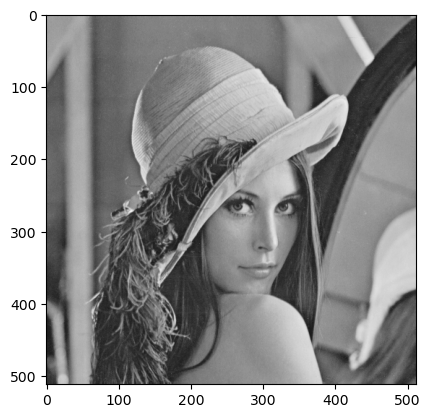

In [29]:
from scipy.fftpack import fftshift, ifftshift, fft2, ifft2

# Carregar a imagem lena.tif
im = np.array(plt.imread(DIR_FILES + '/lena.tif'))
plt.imshow(im, cmap='gray', vmin=0, vmax=255);

### Aplicando padding na imagem

In [30]:
im_fill = np.zeros((2*im.shape[0],2*im.shape[1])) 
im_fill[0:im.shape[0],0:im.shape[1]] = im
im_fft = fftshift(fft2(im_fill))

### Definindo Filtro Butterworth

In [31]:
def butterworth__filter(im_fft, order, D0):
    #Obter as dimensões da imagem
    rows, cols = im_fft.shape

    #Calcular as coordenadas dos pontos centrais
    center_row = rows // 2
    center_col = cols // 2

    #Calcular a distância de cada ponto ao centro
    D = np.sqrt((np.arange(rows) - center_row) ** 2 + (np.arange(cols) - center_col) ** 2)

    #Calcular a função de transferência do filtro Butterworth
    H = np.zeros((2*im.shape[0],2*im.shape[1])) 
    H = 1/(1+(D/D0)**(2*order)) 

    # Aplicar o filtro multiplicando na frequência
    filtered_freq = im_fft * H

    # Aplicar a transformada inversa de Fourier
    filtered_image_filled = np.real(np.fft.ifft2(np.fft.fftshift(filtered_freq)))
    filtered_image = filtered_image_filled[0:im.shape[0],0:im.shape[1]]

    return filtered_image

Frequências de corte escolhidas -> 30 e 100

### Aplicando Filtro n = 1

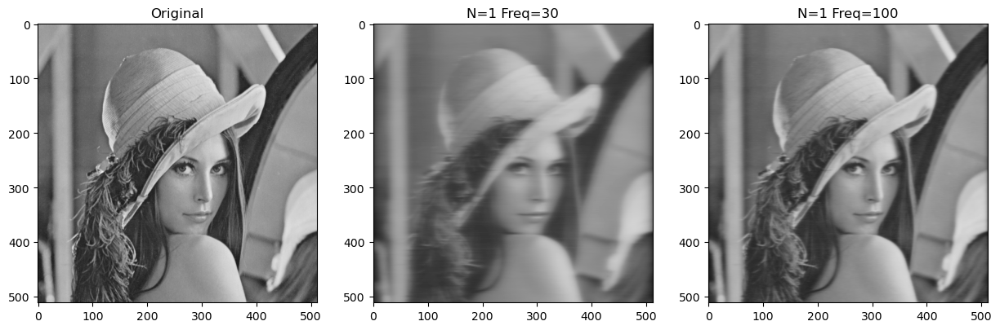

In [32]:
filtered_image_n1_freq30 = butterworth__filter(im_fft, 1, 30) # Freq = 30
filtered_image_n1_freq100 = butterworth__filter(im_fft, 1, 100) # Freq = 100

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(15, 15))
axs[0].imshow(im,cmap='gray',vmin=0,vmax=255)
axs[1].imshow(filtered_image_n1_freq30,cmap='gray',vmin=0,vmax=255)
axs[2].imshow(filtered_image_n1_freq100,cmap='gray',vmin=0,vmax=255)

axs[0].set_title('Original')
axs[1].set_title('N=1 Freq=30')
axs[2].set_title('N=1 Freq=100');

### Aplicando Filtro n = 8

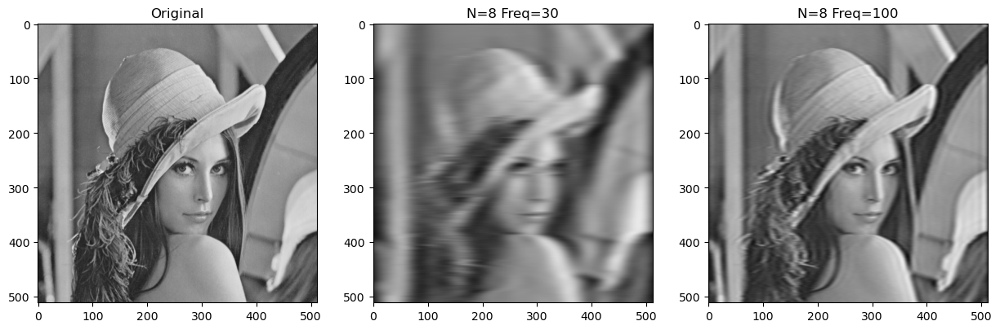

In [33]:
filtered_image_n8_freq30 = butterworth__filter(im_fft, 8, 30) # Freq = 30
filtered_image_n8_freq100 = butterworth__filter(im_fft, 8, 100) # Freq = 100

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(15, 15))
axs[0].imshow(im,cmap='gray',vmin=0,vmax=255)
axs[1].imshow(filtered_image_n8_freq30,cmap='gray',vmin=0,vmax=255)
axs[2].imshow(filtered_image_n8_freq100,cmap='gray',vmin=0,vmax=255)

axs[0].set_title('Original')
axs[1].set_title('N=8 Freq=30')
axs[2].set_title('N=8 Freq=100');

Os filtros Butterworth de ordem mais alta como com n=8 produzem uma transição mais abrupta entre as frequências aceitas e rejeitadas, resultando em uma suavização mais agressiva. Já os de cordens mais baixas como com n=1 proporcionam uma transição mais suave, preservando mais detalhes da imagem original. Alterando as frequeências de corte podemos perceber também a acentuação dessas transições na imagem acarretando em alguns casos em uma imagem borrada não sendo póssível identificar os contornos.

# Q7

Para as imagens ruidosa1.jpg e ruidosa2.jpg, aplique os filtros média 5x5,
mediana 5x5 e o filtro adaptativo de mediana (indo de dimensão 3x3 até a dimensão
11x11) para tratar o ruído. Compare com a imagem original.jpg calculando-se a
PSNR (Peak Signal to Noise Ratio) (Equações na lista)

### Carregando imagens

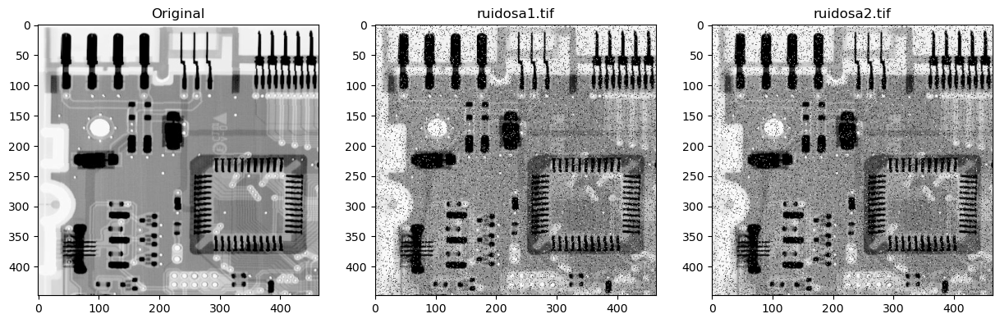

In [34]:
im_original = Image.open(DIR_FILES+'/original.tif').convert('L')
im_original = np.array(im_original)
im_ruidosa1 = np.array(plt.imread(DIR_FILES + '/ruidosa1.tif'))
im_ruidosa2 = np.array(plt.imread(DIR_FILES + '/ruidosa2.tif'))

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(15, 15))
axs[0].imshow(im_original,cmap='gray',vmin=0,vmax=255)
axs[0].set_title('Original')

axs[1].imshow(im_ruidosa1,cmap='gray',vmin=0,vmax=255)
axs[1].set_title('ruidosa1.tif')

axs[2].imshow(im_ruidosa1,cmap='gray',vmin=0,vmax=255)
axs[2].set_title('ruidosa2.tif');

### Cálculo do PSNR

In [35]:
def psnr(im_original, noise):
    height = im_original.shape[0]
    width = im_original.shape[1]
    im_original = np.array(im_original, dtype=float)
    noise = np.array(noise, dtype=float)
    mse = ((im_original - noise)**2 / (height * width)).sum()
    psnr = 20 * np.log10(255/np.sqrt(mse))
    psnr = np.around(psnr,2)
    return psnr

In [36]:
print('PSNR ruidosa1.tif // Original:',psnr(im_original,im_ruidosa1))
print('PSNR ruidosa2.tif // Original:',psnr(im_original,im_ruidosa2))

PSNR ruidosa1.tif // Original: 14.38
PSNR ruidosa2.tif // Original: 9.64


### Filtros de Média, Mediana e Mediana Adaptativa

In [37]:
def conv(image,mask):
    mask = np.flip(mask) # 180º rotate
    cropped_image = np.zeros(((image.shape[0]-2*mask.shape[0]//2),(image.shape[1]-2*mask.shape[1]//2)))
    for l in range(cropped_image.shape[0]):
        for c in range(cropped_image.shape[1]):
            result = np.multiply(image[l:l+mask.shape[0],c:c+mask.shape[1]], mask)
            cropped_image[l,c] = np.sum(result)
    return cropped_image

def mean_filter(image,N):
    mask = 1/N**2 * np.ones((N,N))
    image = np.delete(image,(1), axis = 0)
    image = np.delete(image,(1), axis = 1)
    pad = 3
    padded_image = np.pad(image, pad_width=pad, mode='reflect')
    filtered_image = conv(padded_image,mask)
    return filtered_image

def median_filter(image, N):
    mask = np.ones((N,N))
    pad = N // 2
    padded_image = np.pad(image, pad_width=pad, mode='reflect')
    median_image = np.zeros(image.shape, dtype=np.uint8)
    mask = np.flip(mask)
    for l in range(image.shape[0]):
        for c in range(image.shape[1]):
            new_pixel_value = np.median(mask * padded_image[l:l+mask.shape[0], c:c+mask.shape[0]])
            median_image[l,c] = new_pixel_value  
    return median_image

def adaptive_median_filter(image, max_size):
    img_height, img_width = image.shape
    new_image = np.copy(image)
    
    def local_median(image, x, y, size):
        pad_size = size // 2
        region = image[max(0, x - pad_size):min(img_height, x + pad_size + 1), max(0, y - pad_size):min(img_width, y + pad_size + 1)]
        return np.median(region)

    for i in range(img_height):
        for j in range(img_width):
            size = 3
            while size <= max_size:
                median = local_median(image, i, j, size)
                z_min = image[max(0, i - size // 2), max(0, j - size // 2)]
                z_max = image[min(img_height - 1, i + size // 2), min(img_width - 1, j + size // 2)]
                z_xy = image[i, j]

                A1 = median - z_min
                A2 = median - z_max

                if A1 > 0 and A2 < 0:
                    B1 = int(z_xy) - int(z_min)
                    B2 = int(z_xy) - int(z_max)

                    if B1 > 0 and B2 < 0:
                        new_image[i, j] = z_xy
                    else:
                        new_image[i, j] = median
                    break
                else:
                    size += 2

            if size > max_size:
                new_image[i, j] = median

    return new_image

### Calculando PSNR com filtro de média

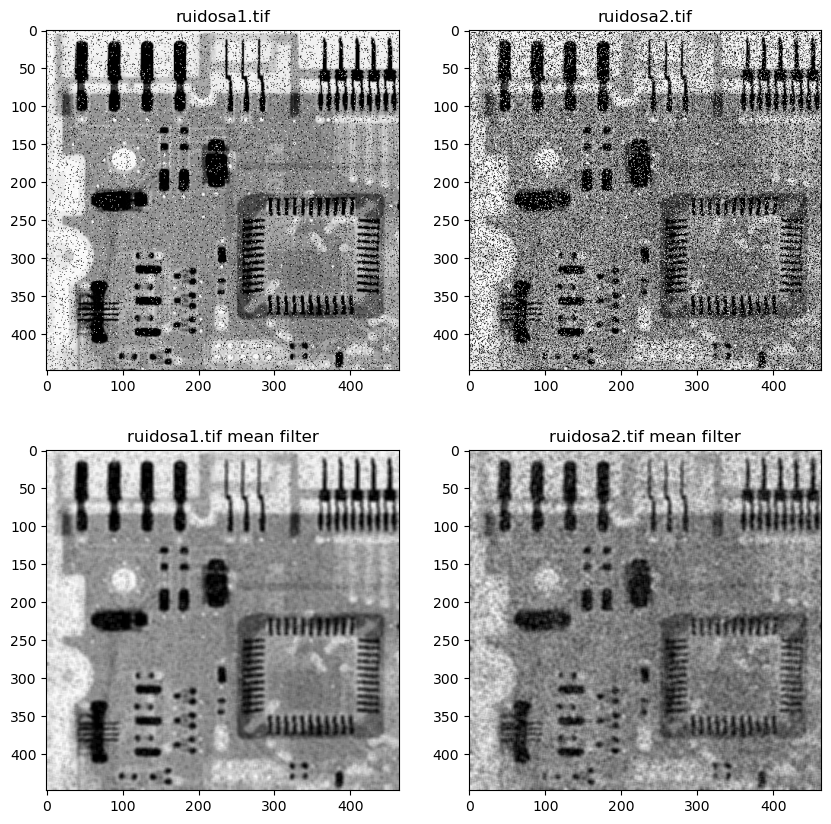

In [38]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))
axs[0][0].imshow(im_ruidosa1,cmap='gray',vmin=0,vmax=255)
axs[0][0].set_title('ruidosa1.tif')

axs[0][1].imshow(im_ruidosa2,cmap='gray',vmin=0,vmax=255)
axs[0][1].set_title('ruidosa2.tif')

axs[1][0].imshow(mean_filter(im_ruidosa1,5),cmap='gray',vmin=0,vmax=255)
axs[1][0].set_title('ruidosa1.tif mean filter')

axs[1][1].imshow(mean_filter(im_ruidosa2,5),cmap='gray',vmin=0,vmax=255)
axs[1][1].set_title('ruidosa2.tif mean filter')

plt.show()

In [39]:
print('PSNR ruidosa1.tif mean filter // Original:',psnr(im_original,mean_filter(im_ruidosa1,5)))
print('PSNR ruidosa2.tif mean filter // Original:',psnr(im_original,mean_filter(im_ruidosa2,5)))

PSNR ruidosa1.tif mean filter // Original: 20.79
PSNR ruidosa2.tif mean filter // Original: 16.33


### Calculando PNSR com filtro de mediana

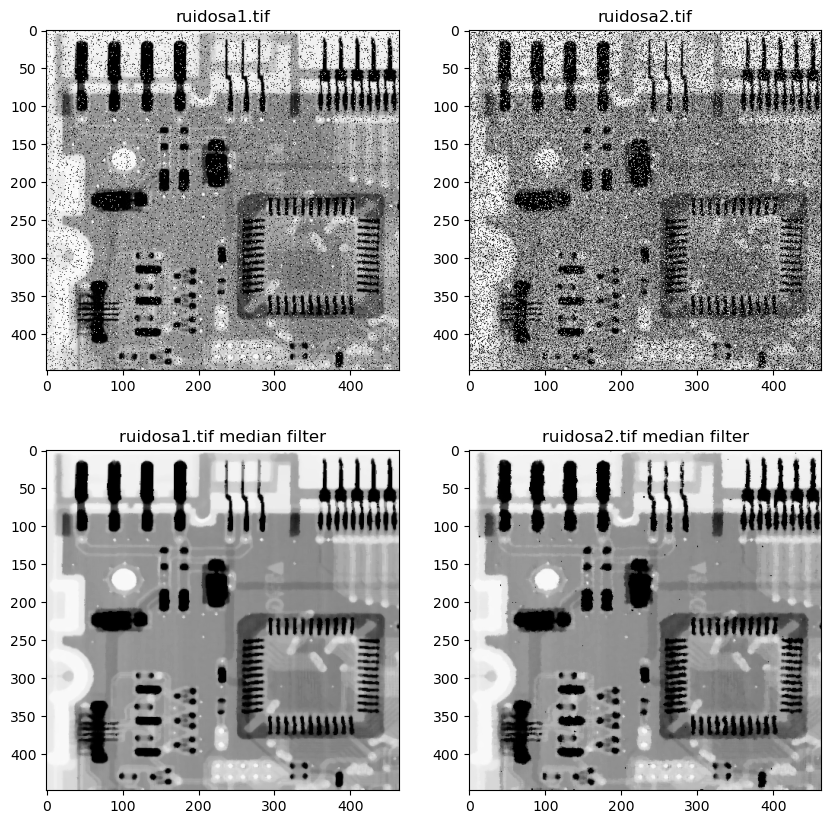

In [40]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))
axs[0][0].imshow(im_ruidosa1,cmap='gray',vmin=0,vmax=255)
axs[0][0].set_title('ruidosa1.tif')

axs[0][1].imshow(im_ruidosa2,cmap='gray',vmin=0,vmax=255)
axs[0][1].set_title('ruidosa2.tif')

axs[1][0].imshow(median_filter(im_ruidosa1,5),cmap='gray',vmin=0,vmax=255)
axs[1][0].set_title('ruidosa1.tif median filter')

axs[1][1].imshow(median_filter(im_ruidosa2,5),cmap='gray',vmin=0,vmax=255)
axs[1][1].set_title('ruidosa2.tif median filter')

plt.show()

In [41]:
print('PSNR ruidosa1.tif median filter // Original:',psnr(im_original,median_filter(im_ruidosa1,5)))
print('PSNR ruidosa2.tif median filter // Original:',psnr(im_original,median_filter(im_ruidosa2,5)))

PSNR ruidosa1.tif median filter // Original: 25.65
PSNR ruidosa2.tif median filter // Original: 22.03


### Calculando PNSR com filtro de mediana adaptativa

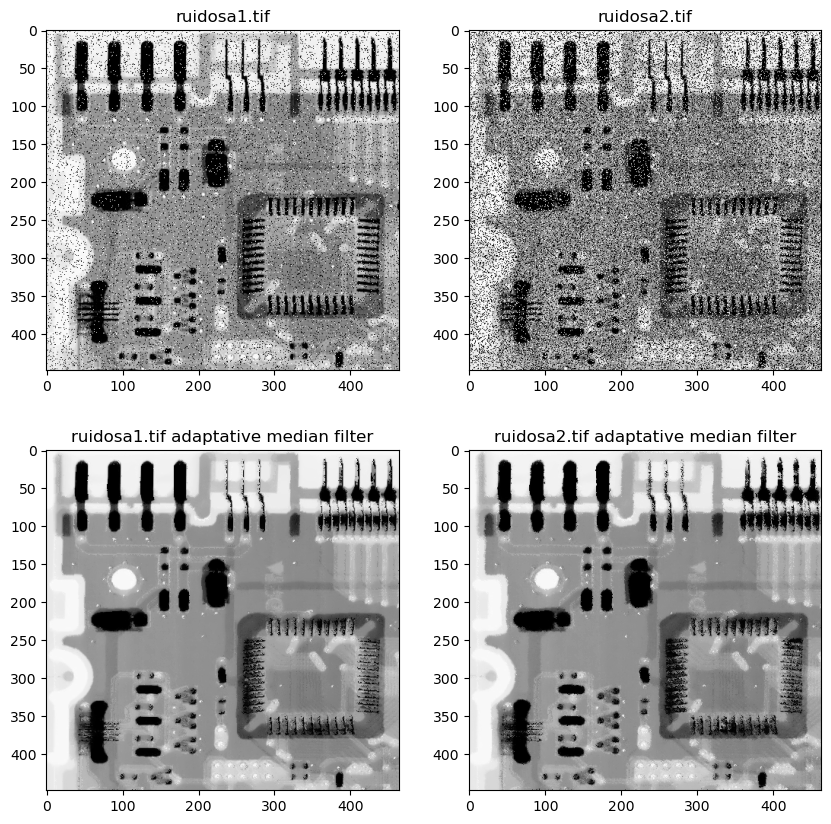

In [42]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))
axs[0][0].imshow(im_ruidosa1,cmap='gray',vmin=0,vmax=255)
axs[0][0].set_title('ruidosa1.tif')

axs[0][1].imshow(im_ruidosa2,cmap='gray',vmin=0,vmax=255)
axs[0][1].set_title('ruidosa2.tif')

axs[1][0].imshow(adaptive_median_filter(im_ruidosa1,11),cmap='gray',vmin=0,vmax=255)
axs[1][0].set_title('ruidosa1.tif adaptative median filter')

axs[1][1].imshow(adaptive_median_filter(im_ruidosa2,11),cmap='gray',vmin=0,vmax=255)
axs[1][1].set_title('ruidosa2.tif adaptative median filter')

plt.show()

In [43]:
print('PSNR ruidosa1.tif adptative median filter // Original:',psnr(im_original,adaptive_median_filter(im_ruidosa1,11)))
print('PSNR ruidosa2.tif adaptative median filter // Original:',psnr(im_original,adaptive_median_filter(im_ruidosa2,11)))

PSNR ruidosa1.tif adptative median filter // Original: 20.4
PSNR ruidosa2.tif adaptative median filter // Original: 20.04


Todos os filtros utilizados aumentaram o PSNR, o que era esperado já que neste caso quanto maior o PSNR menos a imagem é afetada pelo ruído, é possível perceber que o PSNR inicial sem aplicação dos filtros está abaixo de 15.

O filtro de média consegue eliminar bem os ruídos do tipo sal já que funciona como um passa baixas eliminando as altas frequências, mas não elimina bem os ruídos do tipo "pimenta".
Dentre os outros 2 filtros o que apresentou melhor resultado foi o de mediana, uma vez que o PSNR foi o maior em ambas as imagens sendo possível perceber também que de fato a imagem aparenta menos ruídos.

# Perguntas

### 1) Explique o que é resolução espacial e resolução de intensidade e como elas impactam na qualidade da imagem.

A resolução espacial refere-se ao nível de detalhe que uma imagem pode representar, indicado pelo número de pixels na largura e altura. Uma alta resolução espacial resulta em imagens com mais detalhes e nitidez, onde os objetos são bem definidos e ideais para tarefas que exigem precisão, como fotografia de alta qualidade e análise médica. O contrário pode levar a imagem a parecer borrada ou pixelada.
A resolução de intensidade refere-se ao número de níveis de cinza ou valores de cor que um pixel pode representar, geralmente expresso em bits. Uma alta resolução de intensidade permite que a imagem represente uma ampla gama de tons ou cores, proporcionando transições suaves entre diferentes áreas da imagem. Isso torna visíveis os detalhes em áreas com gradientes sutis, como sombras. Já quando há uma baixa resolução de intensidade temos transições bruscas ou banding onde detalhes sutis podem ser perdidos.
Quando a resolução espacial e a resolução de intensidade são ambas altas, a imagem é detalhada e tem transições suaves de tons, resultando em uma alta qualidade visual. Se a resolução espacial for alta, mas a resolução de intensidade for baixa, a imagem pode ser detalhada em termos de forma, mas terá transições de tons abruptas. Da mesma forma, uma baixa resolução espacial com alta resolução de intensidade resultará em transições de tons suaves, mas com falta de detalhes finos.

### 2) Como você explicaria frequência espacial em uma imagem?

A frequência espacial em uma imagem refere-se à variação das intensidades de pixel ao longo do espaço. Ela descreve a rapidez com que as intensidades de pixel mudam ao longo da imagem. É um conceito análogo à frequência temporal no som, onde diferentes frequências correspondem a diferentes tons.

### 3) Explique como deve ser aplicado o filtro homomórfico em uma imagem e em qual modelo ele é baseado.

O filtro homomórfico deve ser aplicado primeiro aplicando o logaritmo na imagem, depois aplica-se a transformada de fourrier convertendo a imagem para o domínio da frequência, após isso é aplicado o filtro passa altas para atenuar as baixas frequências da imagem, logo após aplica-se a transformada inversa de fourrier para retornar a imagem para o domínio espacial e por fim para desfazer a transformação logaritmica é realizada a exponenciação da imagem. O filtro homomórfico é baseado no modelo de iluminação-reflectância, que separa a imagem em duas componentes multiplicativas: a iluminação, que é responsável pela variação suave e global da luz, e a reflectância, que representa os detalhes finos e texturas da cena. 

### 4) Explique os três métodos apresentados no livro texto para estimar a função de degradação na tarefa de restauração de imagens.

Estimativa por Análise de Imagem: Análise direta da imagem degradada para identificar e modelar padrões de degradação.
Método de Estimação pela Observação de Imagens de Referência: Utiliza imagens de referência conhecidas para comparar e ajustar a função de degradação.
Método de Estimação por Experimentação: Realiza experimentos controlados para medir e modelar a degradação em condições específicas.